In [1]:
# DataSet : Copy of Sri_lanka_dengue_cases_weather_weekly_2007_2024_

In [2]:
import pandas as pd
from scipy import stats
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import datetime
import plotly
import plotly.graph_objs as go
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import warnings
warnings.filterwarnings('ignore') 

In [3]:
df = pd.read_csv('Copy of Sri_lanka_dengue_cases_weather_weekly_2007_2024_.csv')
df.head()

,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22950 entries, 0 to 22949
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   District                       22950 non-null  object 
 1   Number_of_Cases                22950 non-null  int64  
 2   Week_Start_Date                22950 non-null  object 
 3   Month                          22950 non-null  int64  
 4   Year                           22950 non-null  int64  
 5   Week                           22950 non-null  int64  
 6   Week_End_Date                  22950 non-null  object 
 7   Avg Max Temp (°C)              22950 non-null  float64
 8   Avg Min Temp (°C)              22950 non-null  float64
 9   Avg Apparent Max Temp (°C)     22950 non-null  float64
 10  Avg Apparent Min Temp (°C)     22950 non-null  float64
 11  Total Precipitation (mm)       22950 non-null  float64
 12  Total Rain (mm)                22950 non-null 

In [5]:
df.shape

(22950, 19)

In [6]:
df.select_dtypes(include=['object']).columns

Index(['District', 'Week_Start_Date', 'Week_End_Date'], dtype='object')

In [7]:
# Convert 'Week_Start_Date' and 'Week_End_Date' columns to datetime:

df['Week_Start_Date'] = pd.to_datetime(df['Week_Start_Date'], format='%Y-%m-%d')
df['Week_End_Date'] = pd.to_datetime(df['Week_End_Date'], format='%Y-%m-%d')

In [8]:
print(df.dtypes)

District                                 object
Number_of_Cases                           int64
Week_Start_Date                  datetime64[ns]
Month                                     int64
Year                                      int64
Week                                      int64
Week_End_Date                    datetime64[ns]
Avg Max Temp (°C)                       float64
Avg Min Temp (°C)                       float64
Avg Apparent Max Temp (°C)              float64
Avg Apparent Min Temp (°C)              float64
Total Precipitation (mm)                float64
Total Rain (mm)                         float64
Avg Wind Speed (km/h)                   float64
Max Wind Gusts (km/h)                   float64
Weather Code                              int64
Avg Daylight Duration (hours)           float64
Avg Sunrise Time                          int64
Avg Sunset Time                           int64
dtype: object


In [9]:
# Check for missing values
missing_values = df.isnull().sum()
missing_values

District                         0
Number_of_Cases                  0
Week_Start_Date                  0
Month                            0
Year                             0
Week                             0
Week_End_Date                    0
Avg Max Temp (°C)                0
Avg Min Temp (°C)                0
Avg Apparent Max Temp (°C)       0
Avg Apparent Min Temp (°C)       0
Total Precipitation (mm)         0
Total Rain (mm)                  0
Avg Wind Speed (km/h)            0
Max Wind Gusts (km/h)            0
Weather Code                     0
Avg Daylight Duration (hours)    0
Avg Sunrise Time                 0
Avg Sunset Time                  0
dtype: int64

# Summary Statistics

In [10]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Number_of_Cases,22950.0,34.74915,0.0,2.0,9.0,31.0,2631.0,87.465172
Week_Start_Date,22950,2015-10-14 16:25:05.882352896,2007-01-01 00:00:00,2011-05-23 00:00:00,2015-10-15 12:00:00,2020-03-09 00:00:00,2024-07-15 00:00:00,NaN
Month,22950.0,6.438998,1.0,3.0,6.0,9.0,12.0,3.443373
Year,22950.0,2015.293028,2007.0,2011.0,2015.0,2020.0,2024.0,5.080958
Week,22950.0,26.228758,1.0,13.0,26.0,39.0,53.0,15.032246
Week_End_Date,22950,2015-10-21 16:25:05.882352896,2007-01-08 00:00:00,2011-05-30 00:00:00,2015-10-22 12:00:00,2020-03-16 00:00:00,2024-07-22 00:00:00,NaN
Avg Max Temp (°C),22950.0,29.606447,15.6,28.15,29.425,31.4125,38.6125,3.030273
Avg Min Temp (°C),22950.0,23.524391,7.2125,22.45,24.025,25.2875,29.2625,2.765594
Avg Apparent Max Temp (°C),22950.0,33.94584,13.4875,32.3,34.1375,36.2875,44.3375,3.734016
Avg Apparent Min Temp (°C),22950.0,26.904558,4.7125,25.7125,27.7875,29.075,33.85,3.589638


In [11]:
# Check if all values in the "Total Precipitation (mm)" and "Total Rain (mm)" are identical: 

are_identical = df['Total Precipitation (mm)'].equals(df['Total Rain (mm)'])

print(f"Are the two columns identical? {are_identical}")

Are the two columns identical? True


In [12]:
# Drop "Total Rain (mm)":
df = df.drop(columns=['Total Rain (mm)'])

In [13]:
# Check unique values:

print(df["District"].nunique())
print(df["Month"].nunique())
print(df["Year"].nunique())
print(df["Week"].nunique())
print(df["Weather Code"].nunique())

25
12
18
53
10


In [14]:
# Check unique values:
print(df["Weather Code"].value_counts())

Weather Code
51    8072
63    4168
53    2574
1     2440
61    2094
2     1602
3     1158
65     501
55     246
0       95
Name: count, dtype: int64


# Outlier Detection

In [15]:
# Detecting outliers using IQR (Interquartile Range)
numeric_data = df.select_dtypes(include=['number'])

# Calculate the first and third quartile
Q1 = numeric_data.quantile(0.25)
Q3 = numeric_data.quantile(0.75)

# Calculate the interquartile range (IQR)
IQR = Q3 - Q1

# Detect outliers
outliers = ((numeric_data < (Q1 - 1.5 * IQR)) | (numeric_data > (Q3 + 1.5 * IQR))).sum()

print(outliers)

Number_of_Cases                  2572
Month                               0
Year                                0
Week                                0
Avg Max Temp (°C)                1062
Avg Min Temp (°C)                1056
Avg Apparent Max Temp (°C)        953
Avg Apparent Min Temp (°C)       1177
Total Precipitation (mm)         1165
Avg Wind Speed (km/h)             388
Max Wind Gusts (km/h)             291
Weather Code                     5295
Avg Daylight Duration (hours)       0
Avg Sunrise Time                    0
Avg Sunset Time                     0
dtype: int64


* The results show a substantial number of outliers in weather-related variables and the "Number_of_Cases" column. 

# Univariate Analysis - Histogram

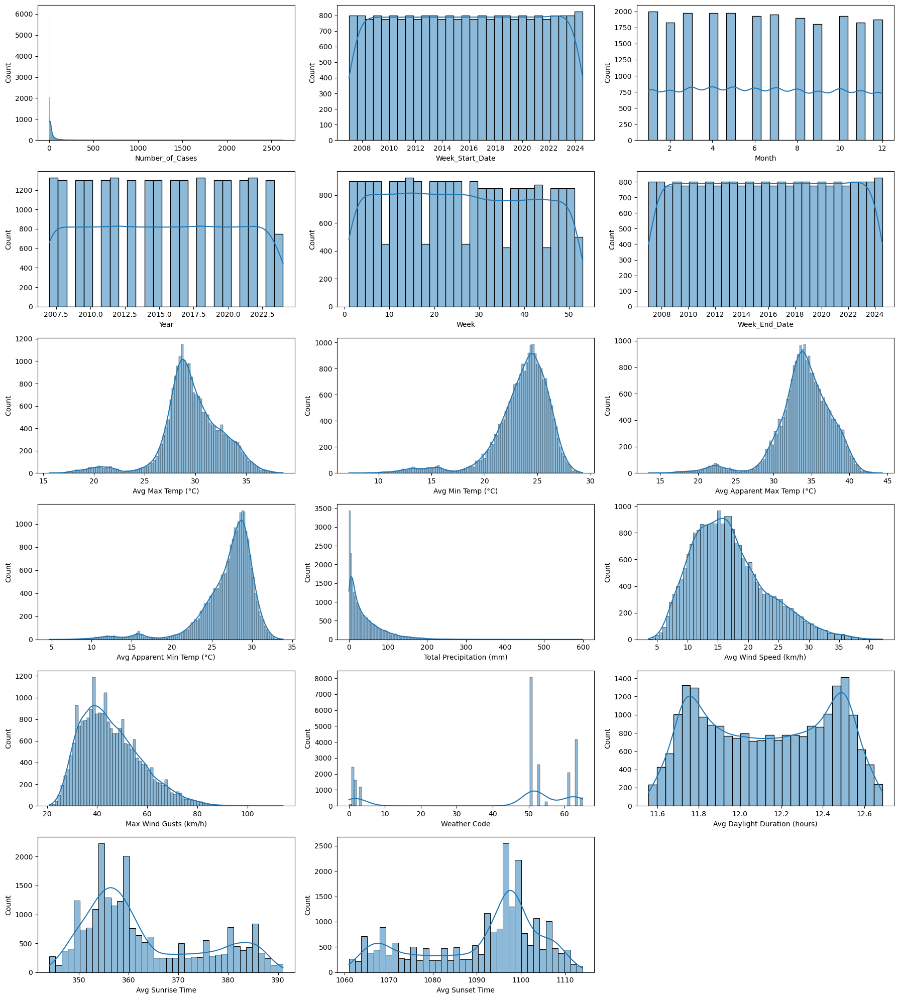

In [16]:
# Exclude the "District" column
columns_to_plot = df.columns[df.columns != "District"]

num_rows = 6
num_cols = 3

# Create a grid of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18,20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over the selected columns and create histograms
for i, col in enumerate(columns_to_plot):
    sns.histplot(df[col], kde=True, ax=axes[i])
    axes[i].set_xlabel(col)

# Hide any unused subplots
for i in range(len(columns_to_plot), num_rows*num_cols):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()


plt.show()

In [17]:
# Calculate skewness for all numerical columns
skewness = df.select_dtypes(include=['number']).skew()

# Display the skewness values
print(skewness)

Number_of_Cases                  9.113583
Month                            0.025486
Year                             0.007020
Week                             0.036393
Avg Max Temp (°C)               -0.737646
Avg Min Temp (°C)               -1.746280
Avg Apparent Max Temp (°C)      -1.226892
Avg Apparent Min Temp (°C)      -2.146500
Total Precipitation (mm)         2.494746
Avg Wind Speed (km/h)            0.733630
Max Wind Gusts (km/h)            0.739544
Weather Code                    -1.127632
Avg Daylight Duration (hours)   -0.013352
Avg Sunrise Time                 0.704660
Avg Sunset Time                 -0.637918
dtype: float64


* Number_of_Cases (9.113583): This high positive skew indicates that the distribution of case numbers is heavily skewed to the right, with a long tail of higher values. Most cases are likely clustered at lower values, with some extreme high values.
    
* Total Precipitation (mm) (2.494746): The strong positive skew indicates that most precipitation values are low, with some extreme high precipitation events, which creates a long tail to the right.
    
* Avg Apparent Min Temp (°C) (-2.146500): The high negative skew suggests that perceived minimum temperatures are heavily skewed to the left, with most values being lower and fewer extreme high values.    
    
* Avg Apparent Max Temp (°C) (-1.226892): This negative skew shows that perceived maximum temperatures are also skewed to the left, with a tendency toward lower values.    
    
* Weather Code (-1.127632): This negative skew suggests that the distribution of weather codes is left-skewed, meaning certain weather conditions may be more prevalent.   

* The dataset shows a mix of positive and negative skewness across different variables, indicating various levels of asymmetry in the data distributions. 
* Key points include strong positive skewness in "Number_of_Cases" and "Total Precipitation (mm)," suggesting the presence of extreme values. 
* In contrast, several temperature-related variables are negatively skewed, indicating a tendency towards lower values in those distributions.

# Correlation Analysis

In [18]:
numeric_df = df.select_dtypes(include=[np.number])
df_corr = numeric_df.corr(method='pearson')
df_corr= df_corr.applymap("{:.3f}".format)
df_corr

,Number_of_Cases,Month,Year,Week,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
Number_of_Cases,1.000,0.020,0.187,0.016,-0.034,0.026,0.009,0.058,0.086,-0.013,-0.008,0.092,0.005,0.049,0.051
Month,0.020,1.000,-0.047,0.955,-0.135,0.038,-0.119,0.032,0.281,0.051,0.127,0.253,-0.168,-0.416,-0.596
Year,0.187,-0.047,1.000,-0.039,0.094,-0.011,0.091,0.005,0.033,0.069,0.115,0.088,0.017,0.006,0.029
Week,0.016,0.955,-0.039,1.000,-0.118,0.050,-0.099,0.047,0.286,0.057,0.135,0.262,-0.135,-0.449,-0.579
Avg Max Temp (°C),-0.034,-0.135,0.094,-0.118,1.000,0.727,0.921,0.723,-0.368,0.224,0.024,-0.222,0.349,-0.233,0.268
Avg Min Temp (°C),0.026,0.038,-0.011,0.050,0.727,1.000,0.716,0.955,-0.137,0.532,0.166,-0.030,0.352,-0.299,0.213
Avg Apparent Max Temp (°C),0.009,-0.119,0.091,-0.099,0.921,0.716,1.000,0.803,-0.208,-0.018,-0.215,-0.061,0.286,-0.245,0.173
Avg Apparent Min Temp (°C),0.058,0.032,0.005,0.047,0.723,0.955,0.803,1.000,-0.049,0.297,-0.020,0.069,0.287,-0.287,0.136
Total Precipitation (mm),0.086,0.281,0.033,0.286,-0.368,-0.137,-0.208,-0.049,1.000,-0.229,-0.089,0.461,-0.177,-0.106,-0.334
Avg Wind Speed (km/h),-0.013,0.051,0.069,0.057,0.224,0.532,-0.018,0.297,-0.229,1.000,0.725,-0.172,0.376,-0.208,0.324


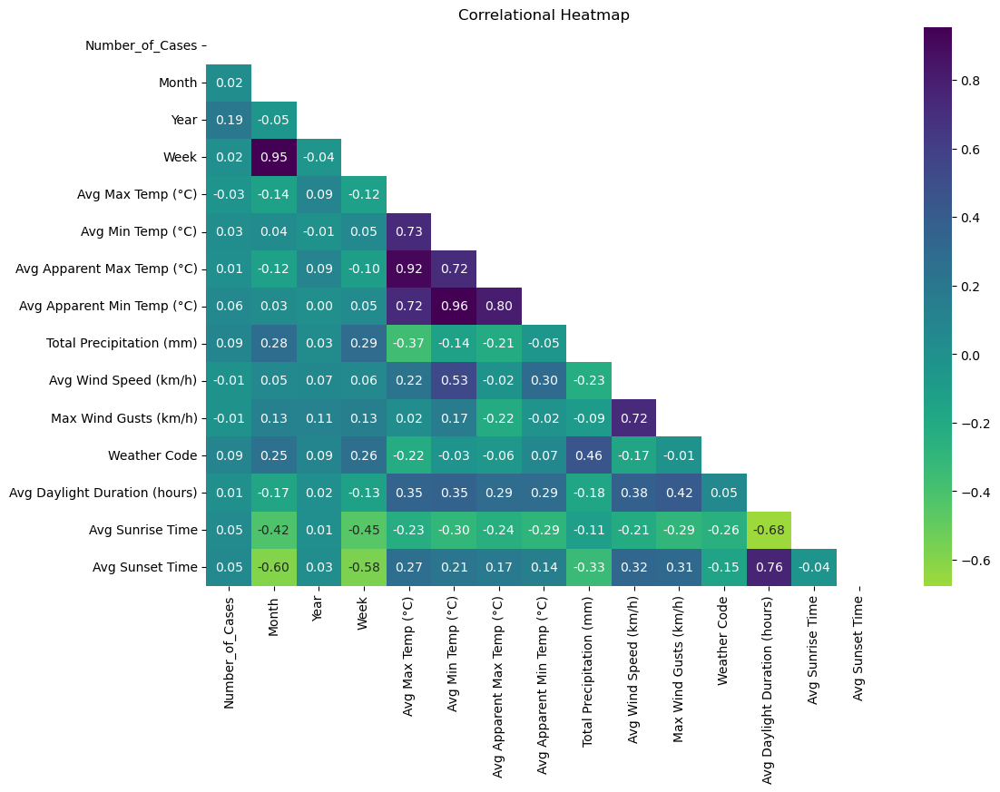

In [19]:
# Correlation Matrix
correlation_matrix = numeric_df.corr()
plt.figure(figsize=(12, 8))
mask = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix, annot=True, cmap='viridis_r', center=0, mask=mask, fmt=".2f")
plt.xticks(rotation = 90, fontsize=10)
plt.yticks(fontsize=10)
plt.title('Correlational Heatmap')
plt.show()

In [20]:
# Strongest Positive Correlated Features

numeric_df = df.select_dtypes(include=[np.number])
df_corr = numeric_df.corr(method='pearson')

# Threshold for high correlation
threshold = 0.70

# Extract the pairs of features with correlation values greater than the threshold
corr_pairs = df_corr.unstack()
high_corr = corr_pairs[(corr_pairs > threshold) & (corr_pairs < 1)]

# Drop duplicate pairs by sorting the index and dropping duplicates
high_corr = high_corr.reset_index()
high_corr.columns = ['Feature1', 'Feature2', 'Correlation']
high_corr = high_corr.drop_duplicates(subset=['Correlation'])

# Sort by correlation value in descending order
high_corr = high_corr.sort_values(by='Correlation', ascending=False)

# Display the pairs
high_corr

,Feature1,Feature2,Correlation
7,Avg Min Temp (°C),Avg Apparent Min Temp (°C),0.955261
0,Month,Week,0.954724
3,Avg Max Temp (°C),Avg Apparent Max Temp (°C),0.921176
10,Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),0.802614
16,Avg Daylight Duration (hours),Avg Sunset Time,0.759987
2,Avg Max Temp (°C),Avg Min Temp (°C),0.727278
14,Avg Wind Speed (km/h),Max Wind Gusts (km/h),0.724716
4,Avg Max Temp (°C),Avg Apparent Min Temp (°C),0.722800
6,Avg Min Temp (°C),Avg Apparent Max Temp (°C),0.716471


In [21]:
# Strongest Negative Correlated Features

# Set the threshold for the negative correlation value
threshold = -0.5

# Extract the pairs of features with correlation values between -1 and the threshold
neg_corr_pairs = df_corr.unstack()
high_neg_corr = neg_corr_pairs[(neg_corr_pairs < threshold) & (neg_corr_pairs > -1)]

# Drop duplicate pairs by sorting the index and dropping duplicates
high_neg_corr = high_neg_corr.reset_index()
high_neg_corr.columns = ['Feature1', 'Feature2', 'Correlation']
high_neg_corr = high_neg_corr.drop_duplicates(subset=['Correlation'])

# Filter out self-correlations
high_neg_corr = high_neg_corr[high_neg_corr['Feature1'] != high_neg_corr['Feature2']]

# Sort by correlation value in ascending order 
high_neg_corr = high_neg_corr.sort_values(by='Correlation')

# Display the pairs
high_neg_corr

,Feature1,Feature2,Correlation
2,Avg Daylight Duration (hours),Avg Sunrise Time,-0.676095
0,Month,Avg Sunset Time,-0.595878
1,Week,Avg Sunset Time,-0.579292


In [22]:
df_corr["Number_of_Cases"].sort_values(ascending=False)

Number_of_Cases                  1.000000
Year                             0.186814
Weather Code                     0.092491
Total Precipitation (mm)         0.085528
Avg Apparent Min Temp (°C)       0.058335
Avg Sunset Time                  0.050656
Avg Sunrise Time                 0.049056
Avg Min Temp (°C)                0.026080
Month                            0.019516
Week                             0.016326
Avg Apparent Max Temp (°C)       0.008545
Avg Daylight Duration (hours)    0.005430
Max Wind Gusts (km/h)           -0.007809
Avg Wind Speed (km/h)           -0.013081
Avg Max Temp (°C)               -0.034041
Name: Number_of_Cases, dtype: float64

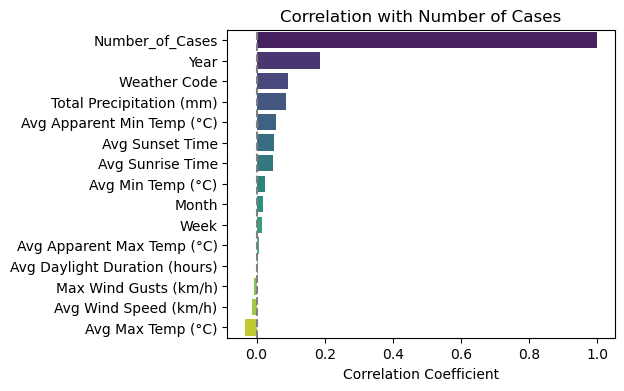

In [23]:
# sorted_corr values are numeric
sorted_corr = df_corr["Number_of_Cases"].sort_values(ascending=False).astype(float)

# Create a bar plot
plt.figure(figsize=(5,4))
sns.barplot(x=sorted_corr.values, y=sorted_corr.index, palette="viridis")

plt.title('Correlation with Number of Cases')
plt.xlabel('Correlation Coefficient')
plt.ylabel('')

plt.axvline(x=0, color='grey', linestyle='--')
plt.show()

* The correlations between the number of cases and other variables are generally weak, with the strongest being between the number of cases and the year (0.186814). 
* This suggests that, while some environmental factors like precipitation and temperature might have a minor influence, they don't strongly correlate with the number of cases. 

In [24]:
print(df.select_dtypes(include=['int64','float64']).columns)

Index(['Number_of_Cases', 'Month', 'Year', 'Week', 'Avg Max Temp (°C)',
       'Avg Min Temp (°C)', 'Avg Apparent Max Temp (°C)',
       'Avg Apparent Min Temp (°C)', 'Total Precipitation (mm)',
       'Avg Wind Speed (km/h)', 'Max Wind Gusts (km/h)', 'Weather Code',
       'Avg Daylight Duration (hours)', 'Avg Sunrise Time', 'Avg Sunset Time'],
      dtype='object')


# Insight into "Number_of_Cases"

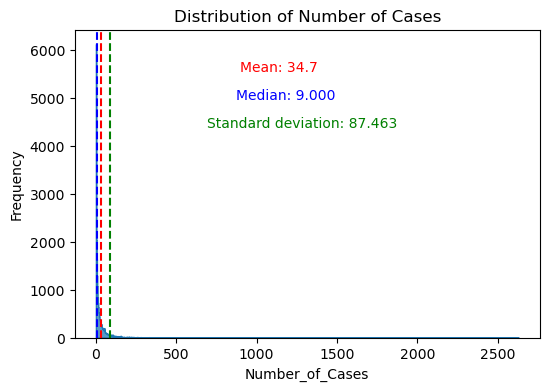

In [25]:
plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='Number_of_Cases', element='step', common_norm=False)


mean = np.mean(df['Number_of_Cases'])
median = np.median(df['Number_of_Cases'])
std_deviation = np.std(df['Number_of_Cases'])

plt.axvline(mean, color='red', linestyle='--')
plt.axvline(median, color='blue', linestyle='--')
plt.axvline(x=std_deviation, color='green', linestyle='--')

# annotate mean,median & Standard deviation
plt.annotate(f'Mean: {mean:.3}', xy=(mean, plt.gca().get_ylim()[1]), xytext=(100, -30),
             textcoords='offset points', color='red', fontsize=10)
plt.annotate(f'Median: {median:.3f}', xy=(median, plt.gca().get_ylim()[1]), xytext=(100, -50),
             textcoords='offset points', color='blue', fontsize=10)
plt.annotate(f'Standard deviation: {std_deviation:.3f}', xy=(std_deviation, plt.gca().get_ylim()[1]), xytext=(70, -70),
           textcoords='offset points', color='green', fontsize=10)
plt.xlabel('Number_of_Cases')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Cases')
plt.show()

In [26]:
df["Number_of_Cases"].describe()

count    22950.000000
mean        34.749150
std         87.465172
min          0.000000
25%          2.000000
50%          9.000000
75%         31.000000
max       2631.000000
Name: Number_of_Cases, dtype: float64

In [27]:
skewness = df["Number_of_Cases"].skew()
print(f"Skewness: {skewness}")

Skewness: 9.113583058608677


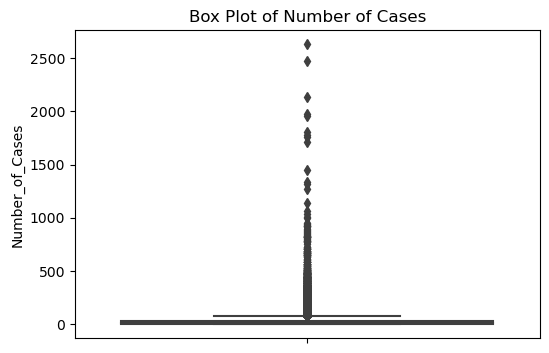

In [28]:
# Create a box plot 
plt.figure(figsize=(6, 4))
sns.boxplot(y='Number_of_Cases', data=df)
plt.ylabel('Number_of_Cases')
plt.title('Box Plot of Number of Cases')
plt.show()

* The data shows a high level of variability in the number of cases, with most observations having relatively few cases (as seen from the median and 25th percentile). 

* The high skewness and standard deviation suggest the presence of a few instances with a significantly large number of cases, which heavily influences the average.

# Categorical Variables and "Number_of_Cases" - Box Plot

In [29]:
# Box Plot for "Number_of_Cases" and "District":

custom_colors = px.colors.qualitative.Plotly[:len(df['District'].unique())]

# Create the box plot using plotly with custom colors
fig = px.box(df, x='District', y='Number_of_Cases', title='Box Plot for Number of Cases and District',
             color='District', color_discrete_sequence=custom_colors)

# Update layout to adjust the figure size
fig.update_layout(width=1000, height=600)

fig.show()

In [30]:
# Box Plot for "Number_of_Cases" and ""Year":

custom_colors = px.colors.qualitative.Plotly[:len(df['Year'].unique())]

# Create the box plot using plotly with custom colors
fig = px.box(df, x='Year', y='Number_of_Cases', title='Box Plot for Number of Cases and Year',
             color='Year', color_discrete_sequence=custom_colors)

# Update layout to adjust the figure size
fig.update_layout(width=1000, height=600)

fig.show()

In [31]:
# Box Plot for "Number_of_Cases" and "Month":

custom_colors = px.colors.qualitative.Plotly[:len(df['Month'].unique())]

# Create the box plot using plotly with custom colors
fig = px.box(df, x='Month', y='Number_of_Cases', title='Box Plot for Number of Cases and Month',
             color='Month', color_discrete_sequence=custom_colors)

# Update layout to adjust the figure size
fig.update_layout(width=1000, height=600)

fig.show()

In [32]:
# Box Plot for "Number_of_Cases" and "Weather Code":

custom_colors = px.colors.qualitative.Plotly[:len(df['Weather Code'].unique())]

# Create the box plot using plotly with custom colors
fig = px.box(df, x='Weather Code', y='Number_of_Cases', title='Box Plot for Number of Cases and Weather Code',
             color='Weather Code', color_discrete_sequence=custom_colors)

# Update layout to adjust the figure size
fig.update_layout(width=1000, height=600)

fig.show()

# Numerical Variables and "Number_of_Cases" - Scatter Plot

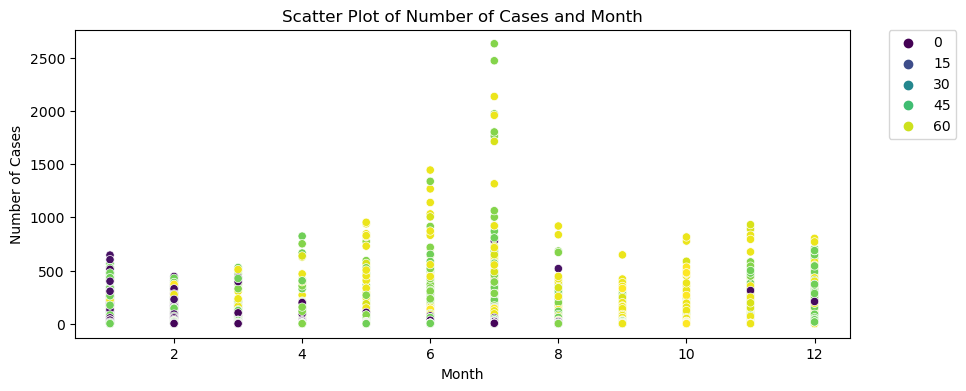

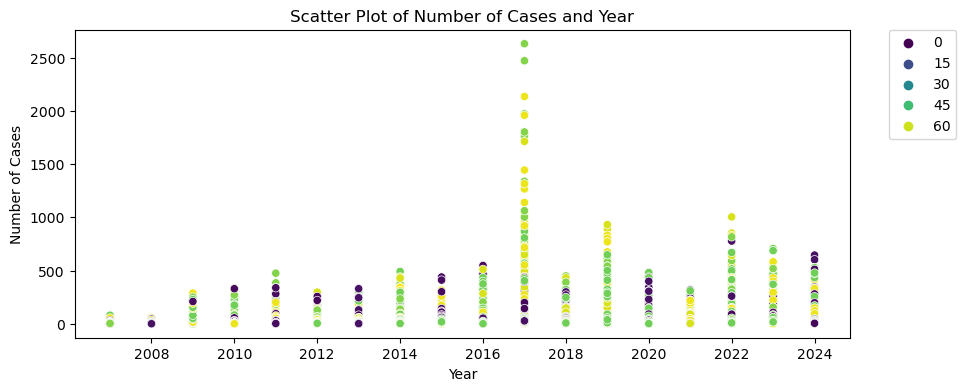

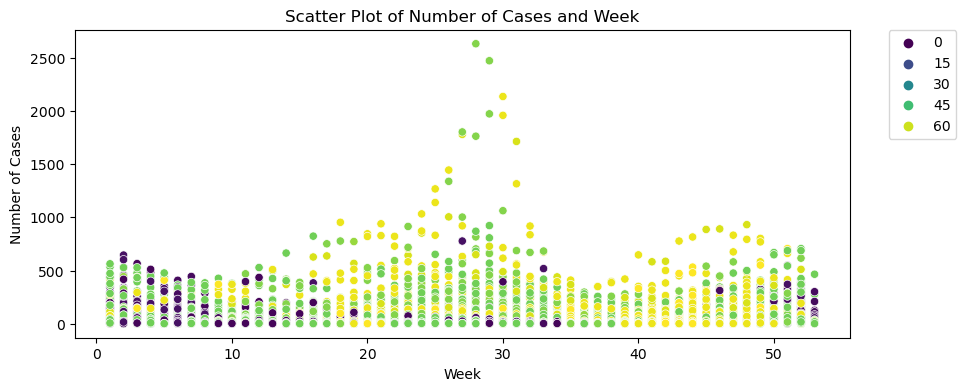

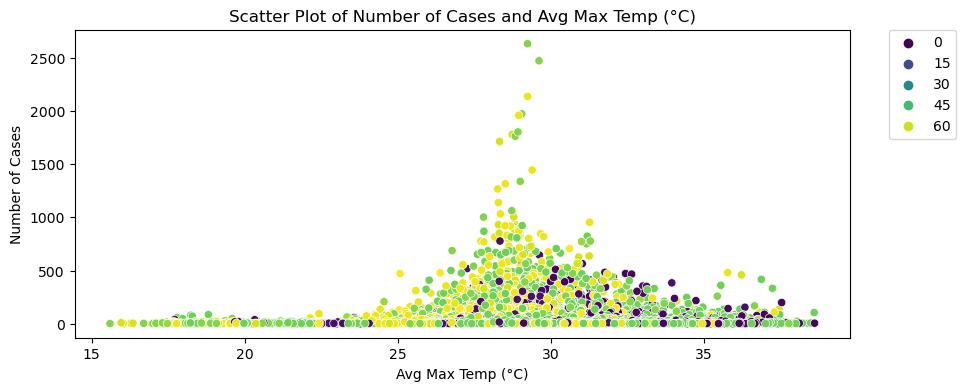

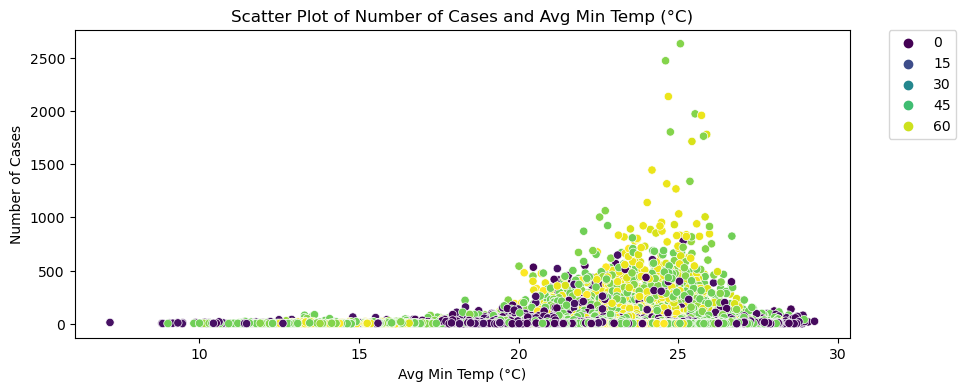

...

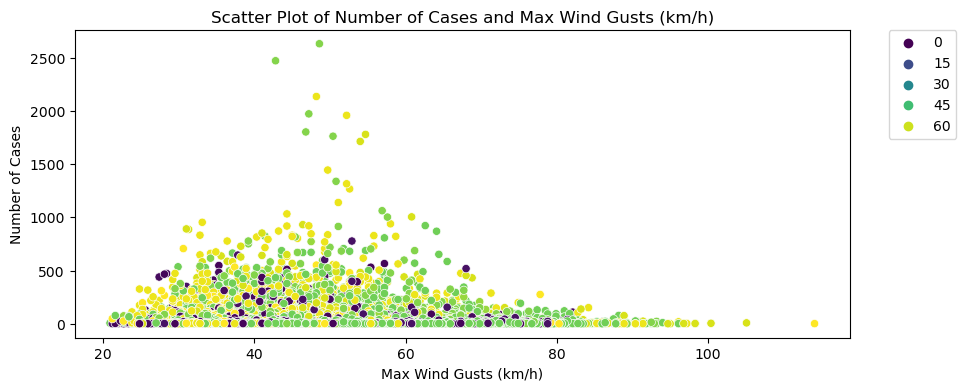

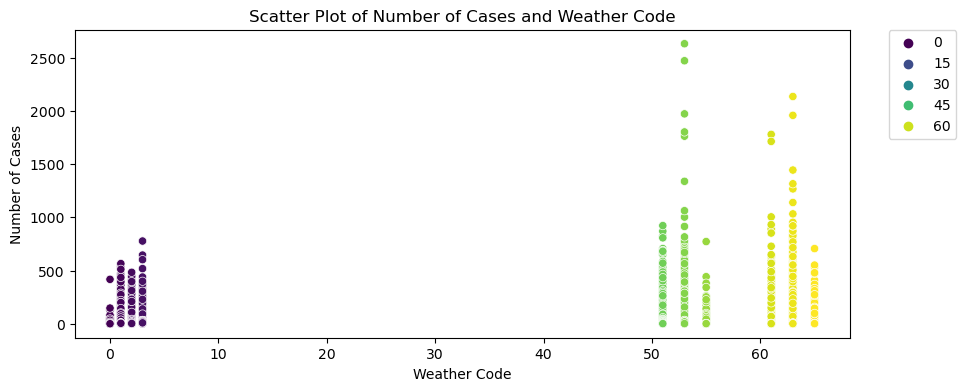

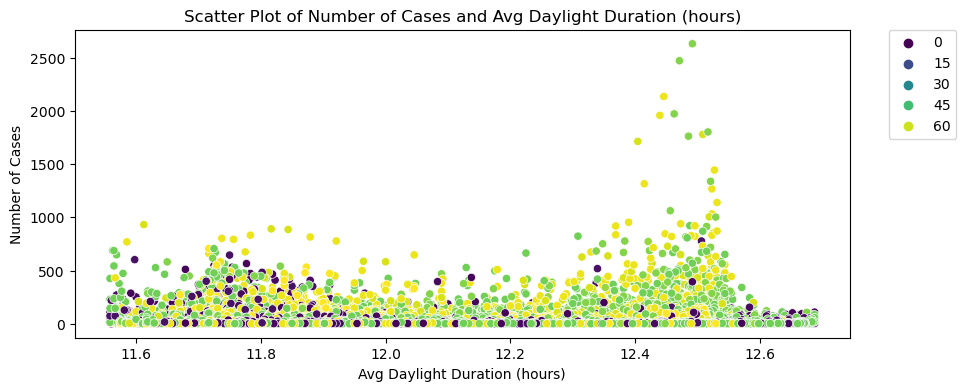

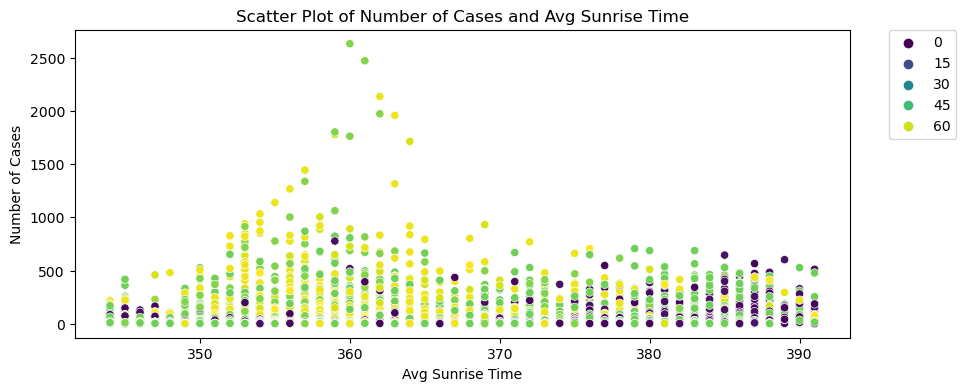

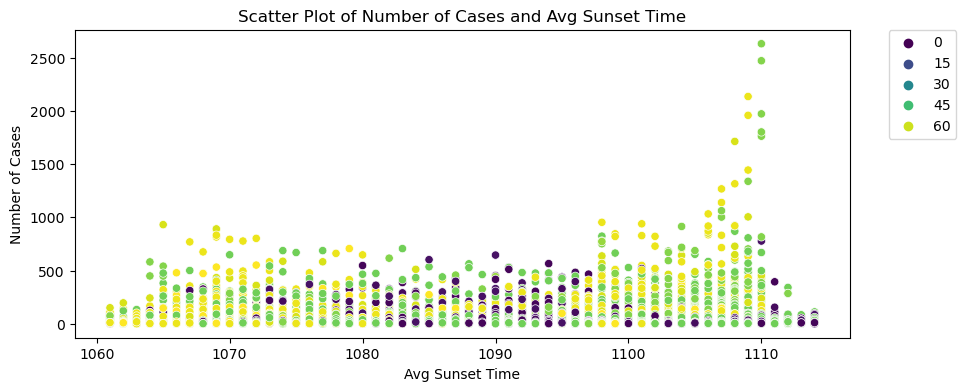

In [33]:
import matplotlib.ticker as ticker

x_variables = ['Month', 'Year', 'Week', 'Avg Max Temp (°C)',
               'Avg Min Temp (°C)', 'Avg Apparent Max Temp (°C)',
               'Avg Apparent Min Temp (°C)', 'Total Precipitation (mm)',
               'Avg Wind Speed (km/h)', 'Max Wind Gusts (km/h)', 'Weather Code',
               'Avg Daylight Duration (hours)', 'Avg Sunrise Time', 'Avg Sunset Time']

for x_var in x_variables:
    plt.figure(figsize=(10, 4))
    sns.scatterplot(data=df, x=x_var, y='Number_of_Cases', hue='Weather Code', palette='viridis')
    
    plt.title(f'Scatter Plot of Number of Cases and {x_var}')
    plt.xlabel(x_var)
    plt.ylabel('Number of Cases')
    
    # Set x-axis ticks to be integer values for the "Year" variable
    if x_var == 'Year':
        plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.show()


**Average "Number_of_Cases" for  each "District"**

In [34]:
# Average "Number_of_Cases" for  each "District"

# Group data by "District" and calculate the Average "Number_of_Cases":
average_Cases = df.groupby("District")["Number_of_Cases"].mean().reset_index()

# Sort the data by "Number_of_Cases" in descending order
average_Cases = average_Cases.sort_values(by="Number_of_Cases", ascending=False)

# Create the bar chart 
fig = px.bar(average_Cases, x="District", y="Number_of_Cases",
             labels={"District": "District", "Number_of_Cases": "Average Number of Cases"},
             title="Average Number of Cases for each District",
             color="District",  
             color_discrete_sequence=px.colors.sequential.Viridis)  

# Set font size for x and y axis labels
fig.update_xaxes(title_font_size=12, tickfont_size=12)
fig.update_yaxes(title_font_size=12, tickfont_size=12)

# Rotate x-axis labels if needed
# fig.update_xaxes(tickangle=90)

fig.show()


* The distribution of average cases across districts shows significant variability. 
* **Colombo** and **Gampaha** have notably higher average cases compared to other districts, which may indicate these are high-density or high-risk areas. 
* In contrast, districts like **Mullaitivu, Kilinochchi, and Mannar** have very low average cases, possibly due to lower population density or other factors that reduce the risk of cases in these areas.

**Average "Number_of_Cases" for each "Year**

In [35]:
# Average "Number_of_Cases" for "Year"

# Group data by "Year" and calculate the Average "Number_of_Cases":
average_Cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Sort the data by "Number_of_Cases" in descending order
average_Cases = average_Cases.sort_values(by="Number_of_Cases", ascending=False)

# Create the bar chart 
fig = px.bar(average_Cases, x="Year", y="Number_of_Cases",
             labels={"Year": "Year", "Number_of_Cases": "Average Number of Cases"},
             title="Average Number of Cases for each Year",
             color="Year",  
             color_discrete_sequence=px.colors.sequential.Viridis)  

# Set font size for x and y axis labels
fig.update_xaxes(title_font_size=12, tickfont_size=12)
fig.update_yaxes(title_font_size=12, tickfont_size=12)

# Rotate x-axis labels if needed
# fig.update_xaxes(tickangle=90)

fig.show()

* The data shows a peak in the average number of cases around 2017, followed by a general decline in the subsequent years. 
* The earlier years, particularly 2007 and 2008, had significantly fewer cases, suggesting that the number of cases may have surged starting in the 2010s, peaked in 2017, and then gradually decreased towards 2024.

**Average "Number_of_Cases" for each "Month**

In [36]:
# Average "Number_of_Cases" for "Month"

# Group data by "Month" and calculate the Average "Number_of_Cases":
average_Cases = df.groupby("Month")["Number_of_Cases"].mean().reset_index()

# Sort the data by "Number_of_Cases" in descending order
average_Cases = average_Cases.sort_values(by="Number_of_Cases", ascending=False)

# Create the bar chart 
fig = px.bar(average_Cases, x="Month", y="Number_of_Cases",
             labels={"Month": "Month", "Number_of_Cases": "Average Number of Cases"},
             title="Average Number of Cases for each Month",
             color="Month",  
             color_discrete_sequence=px.colors.sequential.Viridis)  

# Set font size for x and y axis labels
fig.update_xaxes(title_font_size=12, tickfont_size=12)
fig.update_yaxes(title_font_size=12, tickfont_size=12)

# Rotate x-axis labels if needed
# fig.update_xaxes(tickangle=90)

fig.show()

* July stands out as the peak month with the highest average number of cases, possibly indicating seasonal trends or specific events leading to higher cases during this month.
* The later part of the year, December, also shows a significant increase in cases, followed by June.
* The beginning of the year, particularly January and February, sees a moderate number of cases, while the lowest averages are observed in the spring and autumn months, particularly March and April. 
* This suggests a pattern where cases are higher during the summer and early winter months, with a noticeable drop during the transition seasons.

**Average "Number_of_Cases" for each "Weather Code**

In [37]:
# Average "Number_of_Cases" for "Weather Code"

# Group data by "Month" and calculate the Average "Number_of_Cases":
average_Cases = df.groupby("Weather Code")["Number_of_Cases"].mean().reset_index()

# Sort the data by "Number_of_Cases" in descending order
average_Cases = average_Cases.sort_values(by="Number_of_Cases", ascending=False)

# Create the bar chart 
fig = px.bar(average_Cases, x="Weather Code", y="Number_of_Cases",
             labels={"Weather Code": "Weather Code", "Number_of_Cases": "Average Number of Cases"},
             title="Average Number of Cases for each Weather Code",
             color="Weather Code",  
             color_discrete_sequence=px.colors.sequential.Viridis)  

# Set font size for x and y axis labels
fig.update_xaxes(title_font_size=12, tickfont_size=12)
fig.update_yaxes(title_font_size=12, tickfont_size=12)

# Rotate x-axis labels if needed
# fig.update_xaxes(tickangle=90)

fig.show()

* The weather conditions represented by Weather Codes 63, 53, and 65 are associated with the highest average number of cases, suggesting a potential correlation between these specific weather patterns and an increase in reported cases.
* Weather Codes 55 and 61 also show a relatively high number of cases but are not as significant as the top three.
* The lowest averages are observed with Weather Codes 2, 0, and 1, indicating that these weather conditions might be less conducive to a higher number of reported cases. This distribution suggests that certain weather conditions might influence the frequency or reporting of cases more significantly than others.

**Average Number of Cases by Year for each District**

In [38]:
# Average Number of Cases by Year for each District:

for District, group_data in df.groupby('District'):
    avg_Number_of_Cases_per_year = group_data.groupby('Year')['Number_of_Cases'].mean().reset_index()

    fig = px.bar(avg_Number_of_Cases_per_year, x='Year', y='Number_of_Cases',
                 title=f'Average Number of Cases by Year in {District}',
                 labels={'Number_of_Cases': 'Average Number of Cases', 'Year': 'Year'},
                 color='Number_of_Cases',  
                 color_continuous_scale=px.colors.sequential.Viridis)  
    
    # Update the layout
    fig.update_layout(
        width=1000,
        height=500,
        legend_title_text=District,
        xaxis_title='Year',
        yaxis_title='Average Number of Cases')
    
    # Show the plot
    fig.show()

**Average Number of Cases by Month for each District**

In [39]:
# Average Number of Cases by Month for each District

for District, group_data in df.groupby('District'):
    avg_Number_of_Cases_per_year = group_data.groupby('Month')['Number_of_Cases'].mean().reset_index()

    fig = px.bar(avg_Number_of_Cases_per_year, x='Month', y='Number_of_Cases',
                 title=f'Average Number of Cases by Month in {District}',
                 labels={'Number_of_Cases': 'Average Number of Cases', 'Month': 'Month'},
                 color='Number_of_Cases',  
                 color_continuous_scale=px.colors.sequential.Viridis)  
    
    # Update the layout
    fig.update_layout(
        width=1000,
        height=500,
        legend_title_text=District,
        xaxis_title='Month',
        yaxis_title='Average Number of Cases')
    
    # Show the plot
    fig.show()

**Yearly Average Max Temp and Case Counts**

In [40]:
# Group data by "Year" and calculate the Average "Avg Max Temp (°C)" and "Number_of_Cases"
avg_Max_Temp = df.groupby("Year")["Avg Max Temp (°C)"].mean().reset_index()
avg_cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Create subplots: one for bar chart and one for line chart
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add bar chart for Average Max Temp (°C) with Viridis color scale
fig.add_trace(
    go.Bar(
        x=avg_Max_Temp["Year"], 
        y=avg_Max_Temp["Avg Max Temp (°C)"],
        name="Avg Max Temp (°C)",
        marker=dict(
            color=avg_Max_Temp["Avg Max Temp (°C)"],  
            colorscale='Viridis',  
            colorbar=dict(title="Avg Max Temp (°C)"))),
            secondary_y=False)

# Add line chart for Average Number of Cases
fig.add_trace(
    go.Scatter(
        x=avg_cases["Year"], 
        y=avg_cases["Number_of_Cases"],
        name="Average Number of Cases", 
        mode='lines+markers', 
        line=dict(color='firebrick')),
        secondary_y=True)

# Update layout with titles and axis labels
fig.update_layout(
    title="Average Max Temp (°C) and Number of Cases by Year",
    xaxis_title="Year",
    yaxis_title="Avg Max Temp (°C)",
    yaxis2_title="Average Number of Cases",
    xaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis2=dict(title_font_size=12, tickfont_size=12))

# Update legend and show the plot
fig.update_layout(
    legend_title="Legend",
    legend=dict(x=0.5, y=-0.2, orientation="h"))

fig.show()


**Yearly Average Apparent Max Temp and Case Counts**

In [41]:
# Group data by "Year" and calculate the Average "Avg Apparent Max Temp (°C)" and "Number_of_Cases"

avg_Apparent_Max_Temp = df.groupby("Year")["Avg Apparent Max Temp (°C)"].mean().reset_index()
avg_cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Create subplots: one for bar chart and one for line chart
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add bar chart for Average Apparent Max Temp (°C) with Viridis color scale
fig.add_trace(
    go.Bar(
        x=avg_Apparent_Max_Temp ["Year"], 
        y=avg_Apparent_Max_Temp ["Avg Apparent Max Temp (°C)"],
        name="Avg Apparent Max Temp (°C)",
        marker=dict(
            color=avg_Apparent_Max_Temp["Avg Apparent Max Temp (°C)"],  
            colorscale='Viridis',  
            colorbar=dict(title="Avg Apparent Max Temp (°C)"))),
            secondary_y=False)

# Add line chart for Average Number of Cases
fig.add_trace(
    go.Scatter(
        x=avg_cases["Year"], 
        y=avg_cases["Number_of_Cases"],
        name="Average Number of Cases", 
        mode='lines+markers', 
        line=dict(color='firebrick')),
        secondary_y=True)

# Update layout with titles and axis labels
fig.update_layout(
    title="Average Apparent Max Temp (°C) and Number of Cases by Year",
    xaxis_title="Year",
    yaxis_title="Avg Apparent Max Temp (°C)",
    yaxis2_title="Average Number of Cases",
    xaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis2=dict(title_font_size=12, tickfont_size=12))

# Update legend and show the plot
fig.update_layout(
    legend_title="Legend",
    legend=dict(x=0.5, y=-0.2, orientation="h"))

fig.show()


**Yearly Average Precipitation and Case Counts**

In [42]:
# Group data by "Year" and calculate the Average "Total Precipitation (mm)" and "Number_of_Cases":
avg_precipitation = df.groupby("Year")["Total Precipitation (mm)"].mean().reset_index()
avg_cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Create subplots: one for bar chart and one for line chart
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add bar chart for Average Total Precipitation with Viridis color scale
fig.add_trace(
    go.Bar(
        x=avg_precipitation["Year"], 
        y=avg_precipitation["Total Precipitation (mm)"],
        name="Average Total Precipitation (mm)",
        marker=dict(
            color=avg_precipitation["Total Precipitation (mm)"],  
            colorscale='Viridis',  
            colorbar=dict(title="Total Precipitation (mm)"))),
            secondary_y=False)

# Add line chart for Average Number of Cases
fig.add_trace(
    go.Scatter(
        x=avg_cases["Year"], 
        y=avg_cases["Number_of_Cases"],
        name="Average Number of Cases", 
        mode='lines+markers', 
        line=dict(color='firebrick')),
        secondary_y=True)

# Update layout with titles and axis labels
fig.update_layout(
    title="Average Total Precipitation and Number of Cases by Year",
    xaxis_title="Year",
    yaxis_title="Average Total Precipitation (mm)",
    yaxis2_title="Average Number of Cases",
    xaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis2=dict(title_font_size=12, tickfont_size=12))


# Update legend and show the plot
fig.update_layout(
    legend_title="Legend",
    legend=dict(x=0.5, y=-0.2, orientation="h"))

fig.show()



**Yearly Average Wind Speed and Case Counts**

In [43]:
# Group data by "Year" and calculate the Average "Avg Wind Speed (km/h)" and "Number_of_Cases"
avg_Wind_Speed = df.groupby("Year")["Avg Wind Speed (km/h)"].mean().reset_index()
avg_cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Create subplots: one for bar chart and one for line chart
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add bar chart for Average Wind Speed with Viridis color scale
fig.add_trace(
    go.Bar(
        x=avg_Wind_Speed["Year"], 
        y=avg_Wind_Speed["Avg Wind Speed (km/h)"],
        name="Avg Wind Speed (km/h)",
        marker=dict(
            color=avg_Wind_Speed["Avg Wind Speed (km/h)"],  
            colorscale='Viridis', 
            colorbar=dict(title="Avg Wind Speed (km/h)"))),
            secondary_y=False)

# Add line chart for Average Number of Cases
fig.add_trace(
    go.Scatter(
        x=avg_cases["Year"], 
        y=avg_cases["Number_of_Cases"],
        name="Average Number of Cases", 
        mode='lines+markers', 
        line=dict(color='firebrick')),
        secondary_y=True)

# Update layout with titles and axis labels
fig.update_layout(
    title="Average Wind Speed (km/h) and Number of Cases by Year",
    xaxis_title="Year",
    yaxis_title="Avg Wind Speed (km/h)",
    yaxis2_title="Average Number of Cases",
    xaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis2=dict(title_font_size=12, tickfont_size=12))

# Update legend and show the plot
fig.update_layout(
    legend_title="Legend",
    legend=dict(x=0.5, y=-0.2, orientation="h"))

fig.show()


**Yearly Average Max Wind Gusts and Case Counts**

In [44]:
# Group data by "Year" and calculate the Average "Max Wind Gusts (km/h)" and "Number_of_Cases"

avg_Max_Wind_Gusts = df.groupby("Year")["Max Wind Gusts (km/h)"].mean().reset_index()
avg_cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Create subplots: one for bar chart and one for line chart
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add bar chart for Average Max Wind Gusts (km/h) 
fig.add_trace(
    go.Bar(
        x=avg_Max_Wind_Gusts["Year"], 
        y=avg_Max_Wind_Gusts["Max Wind Gusts (km/h)"],
        name="Avg Max Wind Gusts (km/h)",
        marker=dict(
            color=avg_Max_Wind_Gusts["Max Wind Gusts (km/h)"], 
            colorscale='Viridis',  
            colorbar=dict(title="Max Wind Gusts (km/h)") )),
             secondary_y=False)

# Add line chart for Average Number of Cases
fig.add_trace(
    go.Scatter(
        x=avg_cases["Year"], 
        y=avg_cases["Number_of_Cases"],
        name="Average Number of Cases", 
        mode='lines+markers', 
        line=dict(color='firebrick')),
         secondary_y=True)

# Update layout with titles and axis labels
fig.update_layout(
    title="Average Max Wind Gusts (km/h) and Number of Cases by Year",
    xaxis_title="Year",
    yaxis_title="Max Wind Gusts (km/h)",
    yaxis2_title="Average Number of Cases",
    xaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis2=dict(title_font_size=12, tickfont_size=12))

# Update legend and show the plot
fig.update_layout(
    legend_title="Legend",
    legend=dict(x=0.5, y=-0.2, orientation="h"))

fig.show()


**Yearly Average Sunrise Time and Case Counts**

In [45]:
# Group data by "Year" and calculate the Average "Avg Sunrise Time" and "Number_of_Cases"

avg_Sunrise_Time = df.groupby("Year")["Avg Sunrise Time"].mean().reset_index()
avg_cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Create subplots: one for bar chart and one for line chart
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add bar chart for Average Max Wind Gusts (km/h) 
fig.add_trace(
    go.Bar(
        x=avg_Sunrise_Time["Year"], 
        y=avg_Sunrise_Time["Avg Sunrise Time"],
        name="Avg Sunrise Time",
        marker=dict(
            color=avg_Sunrise_Time["Avg Sunrise Time"], 
            colorscale='Viridis',  
            colorbar=dict(title="Avg Sunrise Time") )),
             secondary_y=False)

# Add line chart for Average Number of Cases
fig.add_trace(
    go.Scatter(
        x=avg_cases["Year"], 
        y=avg_cases["Number_of_Cases"],
        name="Average Number of Cases", 
        mode='lines+markers', 
        line=dict(color='firebrick')),
         secondary_y=True)

# Update layout with titles and axis labels
fig.update_layout(
    title="Average Sunrise Time and Number of Cases by Year",
    xaxis_title="Year",
    yaxis_title="Avg Sunrise Time",
    yaxis2_title="Average Number of Cases",
    xaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis2=dict(title_font_size=12, tickfont_size=12))

# Update legend and show the plot
fig.update_layout(
    legend_title="Legend",
    legend=dict(x=0.5, y=-0.2, orientation="h"))

fig.show()

**Yearly Average Sunset Time and Case Counts**

In [46]:
# Group data by "Year" and calculate the Average "Avg Sunset Time" and "Number_of_Cases"

avg_Sunset_Time = df.groupby("Year")["Avg Sunset Time"].mean().reset_index()
avg_cases = df.groupby("Year")["Number_of_Cases"].mean().reset_index()

# Create subplots: one for bar chart and one for line chart
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add bar chart for Average Max Wind Gusts (km/h) 
fig.add_trace(
    go.Bar(
        x=avg_Sunset_Time["Year"], 
        y=avg_Sunset_Time["Avg Sunset Time"],
        name="Avg Sunset Time",
        marker=dict(
            color=avg_Sunset_Time["Avg Sunset Time"], 
            colorscale='Viridis',  
            colorbar=dict(title="Avg Sunset Time") )),
             secondary_y=False)

# Add line chart for Average Number of Cases
fig.add_trace(
    go.Scatter(
        x=avg_cases["Year"], 
        y=avg_cases["Number_of_Cases"],
        name="Average Number of Cases", 
        mode='lines+markers', 
        line=dict(color='firebrick')),
         secondary_y=True)

# Update layout with titles and axis labels
fig.update_layout(
    title="Average Sunset Time and Number of Cases by Year",
    xaxis_title="Year",
    yaxis_title="Avg Sunset Time",
    yaxis2_title="Average Number of Cases",
    xaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis=dict(title_font_size=12, tickfont_size=12),
    yaxis2=dict(title_font_size=12, tickfont_size=12))

# Update legend and show the plot
fig.update_layout(
    legend_title="Legend",
    legend=dict(x=0.5, y=-0.2, orientation="h"))

fig.show()

**Time Series Analysis:**

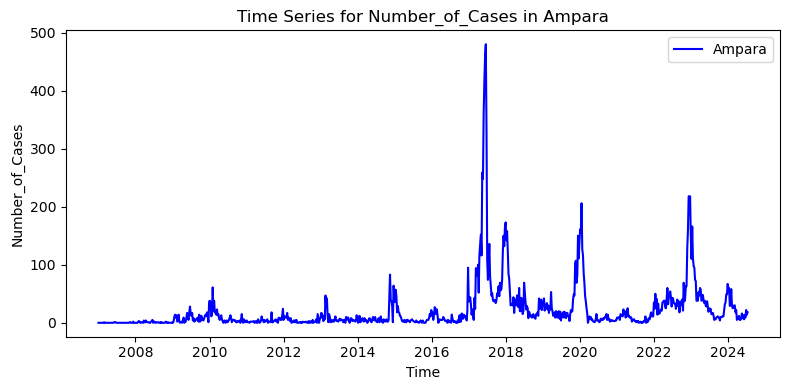

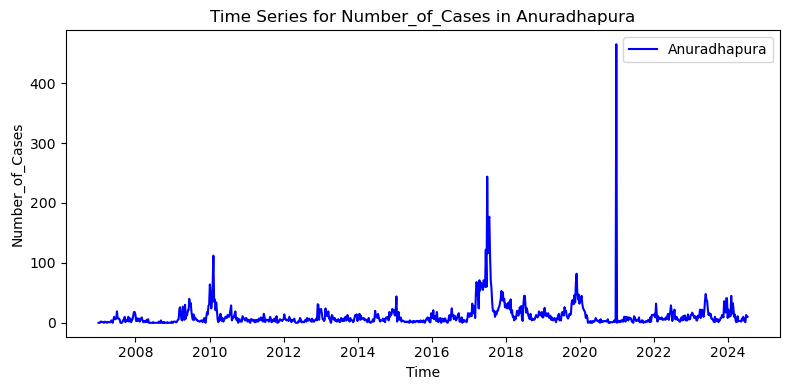

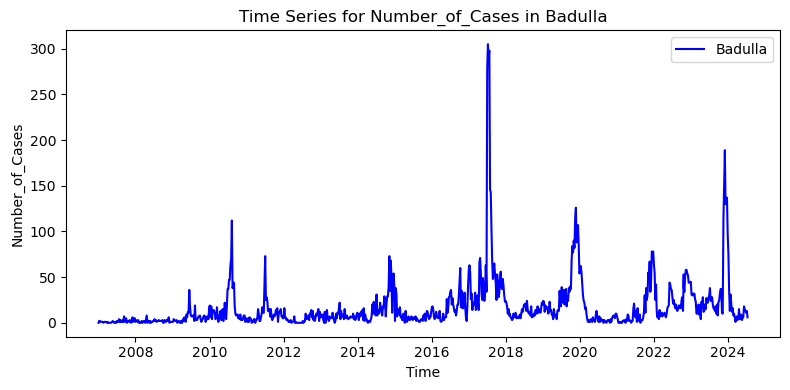

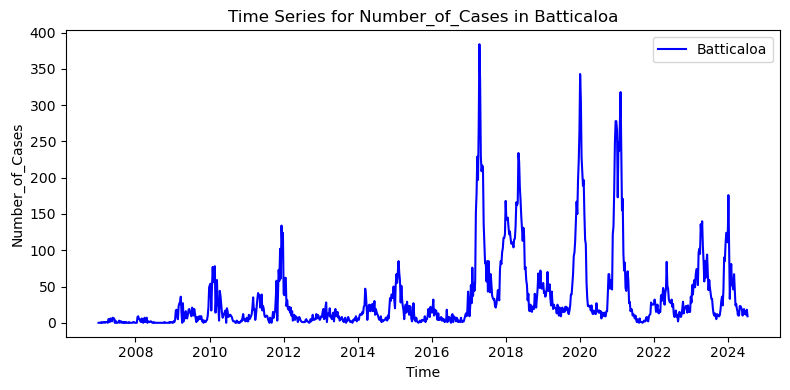

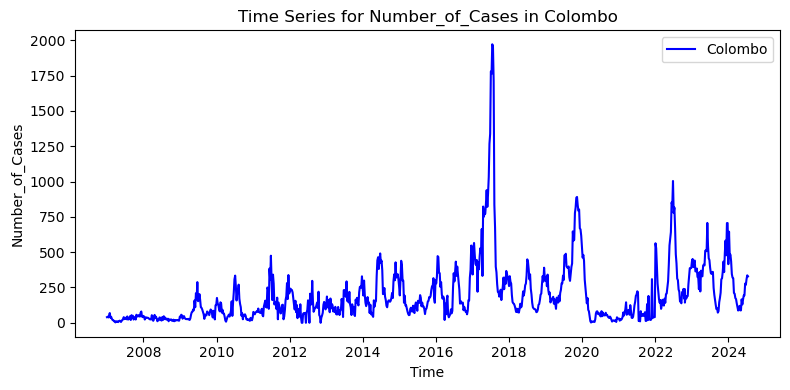

...

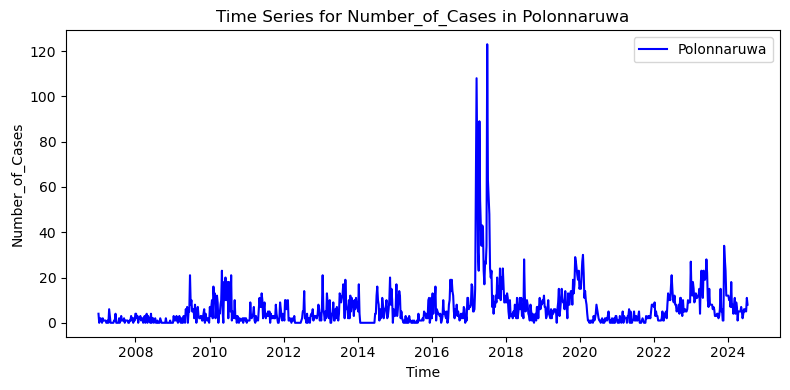

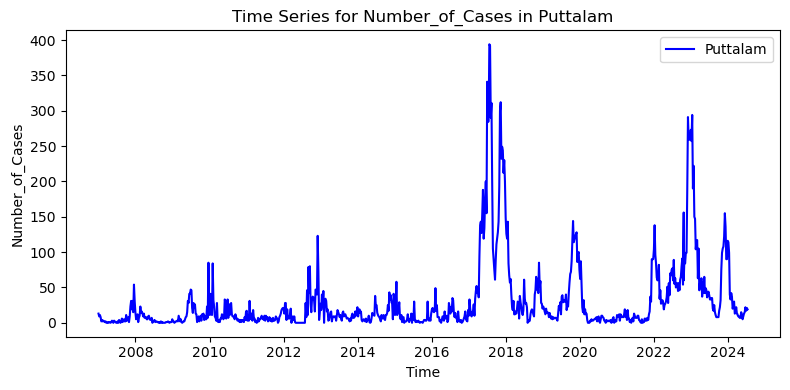

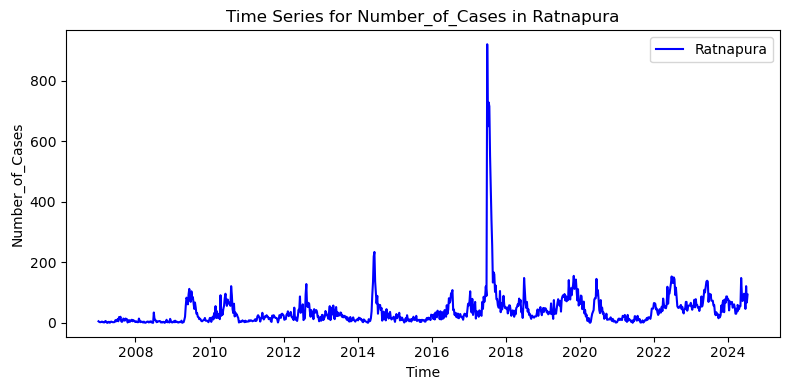

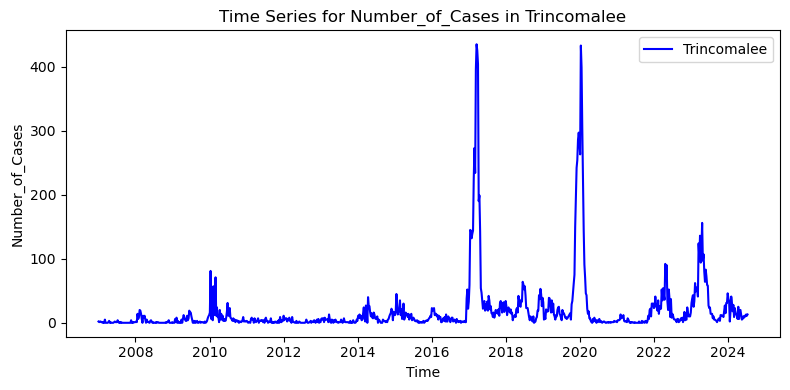

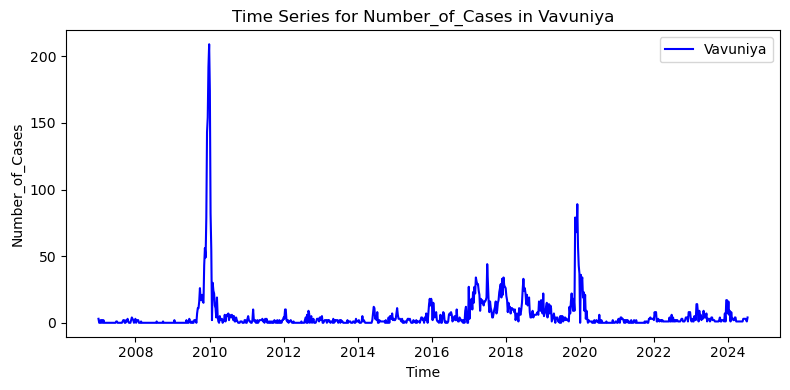

In [47]:
# Sort the DataFrame 
df_sorted = df.sort_values('Week_Start_Date')

# Plot the time series for each County with a trend line
for county_name, group_data in df_sorted.groupby('District'):
    plt.figure(figsize=(8, 4))
    
    # Plot the time series data for total evaporation
    plt.plot(group_data['Week_Start_Date'].values, group_data['Number_of_Cases'].values, label=county_name, color='blue')
    
    # Calculate and plot the trend line
    #z = np.polyfit(group_data['Week_Start_Date'].values, group_data['Number_of_Cases'].values, 1)
    #p = np.poly1d(z)
    #plt.plot(group_data['Week_Start_Date'].values, p(group_data['Week_Start_Date'].values), label=f'Trend Line ({county_name})', color='red', linestyle='--')
    
    plt.title(f'Time Series for Number_of_Cases in {county_name}')
    plt.xlabel('Time')
    plt.ylabel('Number_of_Cases')
    plt.legend()
    plt.tight_layout()
    plt.show()